In [1]:
import numpy as np
import glob
from astropy.io import fits
import os
from pyklip.klip import rotate
import time
import matplotlib.pyplot as plt
from scipy.ndimage import shift

In [2]:
def chop(filelist, outputdir="./",bottom_half_cutoff=450, 
                    top_half_cuton=508,x_offset=13):
    '''
    Chop up the top and bottom halfs of the data.
    '''
    # Check if the output directory exists and if not, create it
    if not os.path.exists(outputdir):
        os.makedirs(outputdir)

    output_filenames = []
    for filename in filelist:
        with fits.open(filename) as hdul:
            data = hdul[0].data

            # Chop up the top and bottom halfs
            top_half = data[top_half_cuton:top_half_cuton+bottom_half_cutoff, :]
            bottom_half = data[:bottom_half_cutoff, :]

            # Combine the top and bottom halves into a single array
            cutout_stack = np.zeros((2, bottom_half.shape[0], bottom_half.shape[1]-x_offset))
            cutout_stack[0,:,:] = bottom_half[:,:-x_offset]
            cutout_stack[1,:,:] = top_half[:,x_offset:]

            # Save the updated FITS file
            output_base_filename = os.path.basename(filename).replace('.fits', '_chopped.fits')
            output_filename = os.path.join(outputdir, output_base_filename)
            output_filenames.append(output_filename)
            hdul[0].data = cutout_stack
            hdul[0].header['HISTORY'] = "Chopped into top and bottom halfs"
            hdul.writeto(output_filename, overwrite=True)

    return output_filenames

def sub_mean_bkg(filelist, xlow=50,xhigh=400,ylow=25,yhigh=350,output_dir="./sub_mean_bkg/"):
    '''
    Subtract the mean background level. 
    '''

    if not os.path.isdir(output_dir):
        os.makedirs(output_dir)

    output_filenames = []

    for filename in filelist: 
        with fits.open(filename) as hdul: 
            hdul[0].data[0] -= np.mean(hdul[0].data[0,ylow:yhigh,xlow:xhigh])
            hdul[0].data[1] -= np.mean(hdul[0].data[1,ylow:yhigh,xlow:xhigh])

            output_base_filename = os.path.basename(filename).replace(".fits","_submnbkg.fits")
            output_filename = os.path.join(output_dir, output_base_filename)
            output_filenames.append(output_filename)
            hdul[0].header['HISTORY'] = "Subtracted the mean background level"
            hdul.writeto(output_filename,overwrite=True)

    return output_filenames

In [3]:
def rotate_cutouts(filelist, output_dir = "./", rotation_centerx = 786, rotation_centery = 234, padsize=400,
                   cutout_centerx = 786, cutout_centery = 234, final_cutout_size=400, centering_method="manual",
                   verbose=False, just_recenter=False): 
    """
    Rotates cutouts by their respective PAs and saves them to output_dir.
    
    Inputs:
        filelist: list of FITS files to process.
        output_dir: directory where rotated cutouts will be saved.
    """

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    output_filenames = []

    for filename in filelist:
        # Load FITS file
        hdulist = fits.open(filename)
        uncollapsed_data = hdulist[0].data
        pa = get_pa(hdulist,mean_PA=False, write_hdr=False)

        output_data = []
        for i in range(2): 
            uncollapsed_padded_data = np.pad(uncollapsed_data[i], ((padsize,padsize),(padsize,padsize)), 'constant', constant_values=(0,0))

            if centering_method == "max_pixel":
                max_pos = np.unravel_index(np.argmax(uncollapsed_data[i]), uncollapsed_data[i].shape)
                rotation_centerx = max_pos[1]
                rotation_centery = max_pos[0]
                cutout_centerx = max_pos[1]
                cutout_centery = max_pos[0]
            elif centering_method == "min_pixel":
                min_pos = np.unravel_index(np.argmin(uncollapsed_data[i]), uncollapsed_data[i].shape)
                rotation_centerx = min_pos[1]
                rotation_centery = min_pos[0]
                cutout_centerx = min_pos[1]
                cutout_centery = min_pos[0]
            elif centering_method =="manual":
                pass
            else:
                raise ValueError("Invalid centering_method. Choose 'max_pixel', 'min_pixel', or 'manual'.")
            
            if verbose:
                print(f"File: {filename}, Slice: {i}, PA: {pa:.2f} deg, Rotation Center: ({rotation_centerx}, {rotation_centery})")
            
            if just_recenter: # If just recentering, do not rotate
                rotated_slice = rotate(uncollapsed_padded_data, 0, [rotation_centerx+padsize,rotation_centery+padsize])[cutout_centery+padsize-final_cutout_size//2:cutout_centery+padsize+final_cutout_size//2, cutout_centerx+padsize-final_cutout_size//2:cutout_centerx+padsize+final_cutout_size//2]
            else: 
                rotated_slice = rotate(uncollapsed_padded_data, pa, [rotation_centerx+padsize,rotation_centery+padsize])[cutout_centery+padsize-final_cutout_size//2:cutout_centery+padsize+final_cutout_size//2, cutout_centerx+padsize-final_cutout_size//2:cutout_centerx+padsize+final_cutout_size//2]
            output_data.append(rotated_slice)
        
        # uncollapsed_padded_data1 = np.pad(uncollapsed_data[0], ((padsize,padsize),(padsize,padsize)), 'constant', constant_values=(0,0))
        # uncollapsed_padded_data2 = np.pad(uncollapsed_data[1], ((padsize,padsize),(padsize,padsize)), 'constant', constant_values=(0,0))


        # rotated_slice1 = rotate(uncollapsed_padded_data1, pa, [rotation_centerx+padsize,rotation_centery+padsize])[cutout_centery+padsize-final_cutout_size//2:cutout_centery+padsize+final_cutout_size//2, cutout_centerx+padsize-final_cutout_size//2:cutout_centerx+padsize+final_cutout_size//2]
        # rotated_slice2 = rotate(uncollapsed_padded_data2, pa, [rotation_centerx+padsize,rotation_centery+padsize])[cutout_centery+padsize-final_cutout_size//2:cutout_centery+padsize+final_cutout_size//2, cutout_centerx+padsize-final_cutout_size//2:cutout_centerx+padsize+final_cutout_size//2]

        #Put the data back in the hdu and save it again 
        hdulist[0].data = np.array(output_data)

        output_filename = os.path.basename(filename).replace('_chopped_mean_sub_diff.fits', '_rotated.fits')
        output_filenames.append(output_filename)
        hdulist.writeto(os.path.join(output_dir, output_filename), overwrite=True)
        
        hdulist.close()

    return output_filenames

def get_pa(hdulist, obsdate=None, rotmode=None, mean_PA=True, write_hdr=True):
    """
    Given a FITS data-header unit list (HDUList), returns the NIRC2 PA in [radians].
    PA is angle of detector relative to sky; ROTMODE is rotator tracking mode;
    PARANG is parallactic angle astrometric; INSTANGL is instrument angle;
    ROTPOSN is rotator physical position.
    Additional PA offset of -0.252 or -0.262 deg is applied for NIRC2 narrow cam
    depending on observation date.
    NOTE that the PA sign is flipped at the very end before output to conform to
    pyKLIP's rotation convention.

    from pyklip's NIRC2Data class.
    
    Inputs:
        hdulist: a FITS HDUList (NOT a single HDU).
        obsdate: date of observation; will try to get from prihdr if not provided.
        rotmode: 'vertical angle' for ADI mode with PA rotating on detector, or
                 'position angle' for mode with PA orientation fixed on detector.
        mean_pa: if True (default), return the mean PA during the exposure.
                 If False, return the PA at the start of the exposure only.
                 Only applies to vertical angle mode.
        write_hdr: if True (default), writes keys to file header and saves them.
    """
    
    prihdr = hdulist[0].header
    
    # Date of NIRC2 servicing that changed PA offset.
    date_2015_4_13 = time.strptime("2015-4-13", "%Y-%m-%d")
    
    # If don't have it, get observation date (UT) from header and make a time object.
    if obsdate is None:
        obsdate = time.strptime(prihdr['DATE-OBS'], "%Y-%m-%d")
    
    # Additional offset to narrow cam PA not included in INSTANGL keyword.
    # This offset changed after instrument servicing on April 13, 2015.
    if prihdr['CAMNAME'].lower() == 'narrow':
        if obsdate < date_2015_4_13:
            zp_offset = -0.252 # [deg]; from Yelda et al. 2010
        elif obsdate >= date_2015_4_13:
            zp_offset = -0.262 # [deg]; from Service et al. 2016
    else:
        zp_offset = 0.
        print("WARNING: No PA offset applied.")
    
    if rotmode is None:
        global _last_rotmode
        try:
            rotmode = prihdr['ROTMODE'].strip().lower()
            _last_rotmode = rotmode
        except:
            rotmode = _last_rotmode.lower()
    rotposn = prihdr['ROTPOSN'] # [deg]
    instangl = prihdr['INSTANGL'] # [deg]

    if rotmode.lower() == 'vertical angle':
        parang = prihdr['PARANG'] # [deg]
        pa_deg = parang + rotposn - instangl + zp_offset # [deg]
    elif rotmode.lower() == 'position angle':
        pa_deg = rotposn - instangl + zp_offset # [deg]
    else:
        raise NotImplementedError
    
    if mean_PA and (rotmode.lower() == 'vertical angle'):
        # Get info for PA smearing calculation.
        epochobj = prihdr['DATE-OBS']
        name = prihdr['targname']
        expref = prihdr['itime']
        coaddref = prihdr['coadds']
        sampref =  prihdr['sampmode']
        msrref =   prihdr['MULTISAM']
        xdimref =  prihdr['naxis1']
        ydimref =  prihdr['naxis2']
        tel = prihdr['TELESCOP']
        dec = prihdr['DEC'] + prihdr['DECOFF']
        if tel.lower() == 'keck ii':
            tel = 'keck2' # just cleaning up str
        
        # Calculate total time of exposure (integration + readout).
        if sampref == 2: totexp = ( expref + 0.18*(xdimref/1024.)**2) * coaddref
        if sampref == 3: totexp = ( expref + (msrref-1)*0.18*(xdimref/1024.)**2)*coaddref
        
        tinteg = totexp # [seconds]
        totexp = totexp/3600. # [hours]
        
        # Get hour angle at start of exposure.
        tmpahinit = prihdr['HA'] # [deg]
        ahobs = 24.*tmpahinit/360. # [hours]
        
        # Estimate vertical position angle at each second of the exposure.
        vp = [] #fltarr(round(3600.*totexp))
        for j in range(0, int(round(3600.*totexp))-1):
            ahtmp = ahobs + (j*1.+0.001)/3600. # [hours]
            vp.append(par_angle(ahtmp, dec, NIRC2Data.observatory_latitude))
            if j == 0: vpref = vp[0]
        vp = np.array(vp)
        
        # Handle case where PA crosses 0 <--> 360.
        vp[vp < 0.] += 360.
        vp[vp > 360.] -= 360.
        if vpref < 0.: vpref += 360.
        if vpref > 360.: vpref -= 360.
        
        # Check that images near PA=0 are handled correctly.
        if any(vp > 350) & any(vp < 10):
            vp[vp > 350] -= 360
        
        vpmean = np.nanmean(vp)
        
        if (vpmean < 0) & (vpref > 350):
            vpmean += 360.
        
        pa_deg_mean = pa_deg + (vpmean - vpref)
    else:
        pa_deg_mean = pa_deg
        vpmean = np.nan
        vpref = np.nan
        totexp = np.nan
    
    if write_hdr:
        prihdr['TOTEXP'] = (totexp, 'Total exposure time [hours]')
        prihdr['PASTART'] = (pa_deg, "Position angle at exposure start [deg]")
        prihdr['PASMEAR'] = ((vpmean - vpref), "Exposure's weighted-mean PA minus PASTART [deg]")
        prihdr['ROTNORTH'] = (pa_deg_mean, "Mean PA of North during exposure [deg]")
        
        hdulist.flush(output_verify='ignore')
    
    # Flip sign to conform to pyKLIP rotation convention.
    return pa_deg_mean

In [4]:
filelist = sorted(f for f in glob.glob("/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced*.fits") if 932 <= int(f.split('/')[-1][8:12]) <= 963)
#857 <= int(f.split('/')[-1][8:12]) <= 900 or 915 <= int(f.split('/')[-1][8:12]) <= 930 or 
print(filelist)
print("Found {} files.".format(len(filelist)))

chopped_filelist = chop(filelist, outputdir="./chopped/")
print("Chopped {} files".format(len(chopped_filelist)))

sub_mean_bkg_filelist = sub_mean_bkg(chopped_filelist)
print("Subtracted the mean background from {} files".format(len(sub_mean_bkg_filelist)))

base_dir = "./"
print("Found {} files".format(len(sub_mean_bkg_filelist)))
output_dir = os.path.join(base_dir, "unrotated")
rotated_files = rotate_cutouts(sub_mean_bkg_filelist, output_dir=output_dir,rotation_centerx = 600, rotation_centery = 300,cutout_centerx=600,cutout_centery=300,just_recenter=True)

['/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0932.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0933.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0934.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0935.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0936.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0937.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0938.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0939.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0940.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0941.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0942.fits', '/home/sh

In [5]:
filelist = sorted(f for f in glob.glob("/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced*.fits") if 857 <= int(f.split('/')[-1][8:12]) <= 900 or 915 <= int(f.split('/')[-1][8:12]) <= 930)
 
print(filelist)
print("Found {} files.".format(len(filelist)))

chopped_filelist = chop(filelist, outputdir="./chopped/")
print("Chopped {} files".format(len(chopped_filelist)))

sub_mean_bkg_filelist = sub_mean_bkg(chopped_filelist)
print("Subtracted the mean background from {} files".format(len(sub_mean_bkg_filelist)))

base_dir = "./"
print("Found {} files".format(len(sub_mean_bkg_filelist)))
output_dir = os.path.join(base_dir, "unrotated")
rotated_files = rotate_cutouts(sub_mean_bkg_filelist, output_dir=output_dir,just_recenter=True)

['/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0857.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0858.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0859.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0860.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0861.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0862.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0863.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0864.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0865.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0866.fits', '/home/shared/exoserver/NIRC2_Pol/jaykes_reduction/2025-12-07/reduced/reduced_0867.fits', '/home/sh

In [6]:
unrotated_datadir = "./unrotated/"
unrotated_filenames = sorted(glob.glob(unrotated_datadir + "*.fits"))
print("Found {} unrotated files.".format(len(unrotated_filenames)))

Found 92 unrotated files.


In [7]:
unrotated_data = []
elevations = []
pas = []
imrot_angles = []
calculated_pa = []


for i, filename in enumerate(unrotated_filenames):
    with fits.open(filename) as hdul:
        unrotated_data.append(hdul[0].data)
        header = hdul[0].header
        elevations.append(header.get('EL', 0))
        pas.append(header.get('PARANG', 0))
        imrot_angles.append(header.get('ROTPPOSN', 0))
        calculated_pa.append(get_pa(hdul, mean_PA=False, write_hdr=False))
unrotated_data = np.array(unrotated_data)

elevations = np.array(elevations)
pas = np.array(pas)
imrot_angles = np.array(imrot_angles)
pas[pas<0] += 360
calculated_pa = np.array(calculated_pa)
print(np.shape(calculated_pa))

(92,)


In [8]:
print(imrot_angles)

[63.52 63.72 63.91 64.1  64.37 64.6  64.87 65.11 65.34 65.56 65.79 65.98
 66.27 66.46 66.75 67.02 67.27 67.51 67.75 67.94 68.1  68.26 68.42 68.58
 68.73 68.89 69.05 69.2  69.36 69.52 69.67 69.83 70.03 70.2  70.38 70.56
 70.77 70.95 71.13 71.32 71.49 71.68 71.86 72.03 75.04 75.24 75.4  75.56
 75.72 75.87 76.02 76.19 76.34 76.48 76.62 76.76 76.91 77.04 77.18 77.31
 77.87 78.04 78.15 78.26 78.42 78.54 78.66 78.76 78.86 78.99 79.09 79.18
 79.27 79.34 79.41 79.48 79.54 79.6  79.66 79.71 79.76 79.8  79.84 79.87
 79.91 79.93 79.96 79.98 79.99 80.   80.   80.  ]


In [9]:
unrotated_diffs = unrotated_data[:, 1, :, :] - unrotated_data[:, 0, :, :]
unrotated_diffs1 = unrotated_diffs[0::4, :, :] - unrotated_diffs[1::4, :, :]
unrotated_diffs2 = unrotated_diffs[2::4, :, :] - unrotated_diffs[3::4, :, :]

pas_collapsed = pas.reshape(-1,4).mean(axis=1)
imrot_collapsed = imrot_angles.reshape(-1,4).mean(axis=1)
elevations_collapsed = elevations.reshape(-1,4).mean(axis=1)
calculated_pa_collapsed = calculated_pa.reshape(-1,4).mean(axis=1)
print(np.shape(calculated_pa_collapsed))

sums = unrotated_data[:, 1, :, :] + unrotated_data[:, 0, :, :]
sums1 = sums[0::4, :, :] + sums[1::4, :, :]
sums2 = sums[2::4, :, :] + sums[3::4, :, :]
print(np.shape(sums1))

(23,)
(23, 400, 400)


/tmp/ipykernel_531959/1750713354.py:1: RuntimeWarning: invalid value encountered in log10
  plt.imshow(np.log10(np.median(sums1,axis=0)),vmin=0)


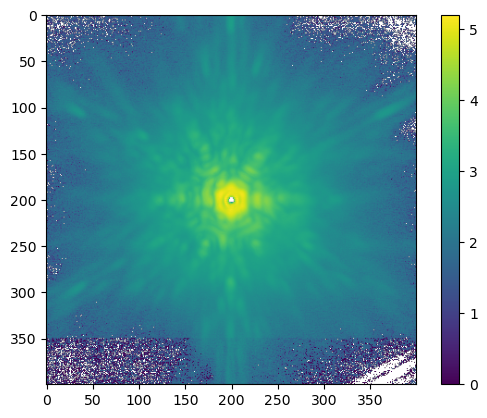

In [10]:
plt.imshow(np.log10(np.median(sums1,axis=0)),vmin=0)
plt.colorbar()

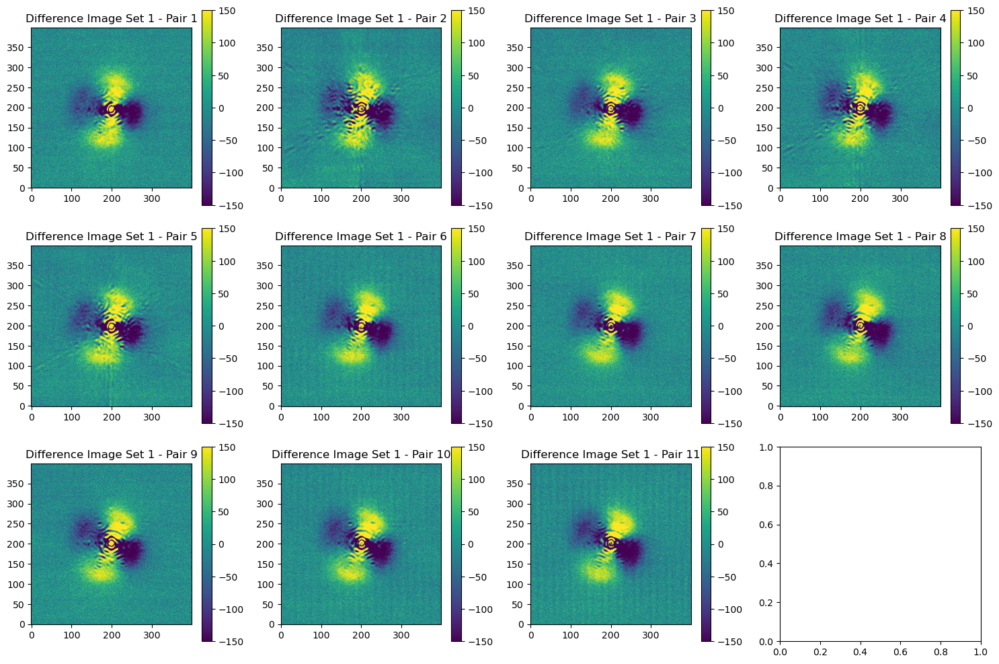

In [11]:
fig, axes = plt.subplots(3, 4, figsize=(15, 10))
axes = axes.flatten()

for i in range(11):
    im = axes[i].imshow(unrotated_diffs1[i], vmin=-150, vmax=150, origin='lower')
    axes[i].set_title(f'Difference Image Set 1 - Pair {i+1}')
    fig.colorbar(im, ax=axes[i])

fig.tight_layout()

In [16]:
offset = -8.0278
rot_angle = -2*pas_collapsed+2*elevations_collapsed+2*imrot_collapsed+4*offset

print(imrot_collapsed)

unrotated_qs = []
unrotated_us = []
for i in range(23):
    q = unrotated_diffs1[i]*np.cos(np.radians(rot_angle[i])) + unrotated_diffs2[i]*np.sin(np.radians(rot_angle[i]))
    u = -unrotated_diffs1[i]*np.sin(np.radians(rot_angle[i])) + unrotated_diffs2[i]*np.cos(np.radians(rot_angle[i]))
    unrotated_qs.append(q)
    unrotated_us.append(u)
unrotated_qs = np.array(unrotated_qs)
unrotated_us = np.array(unrotated_us) 

center = [203,197]
indices = np.indices(unrotated_qs.shape[1:3])
radii = np.sqrt((indices[0] - center[0])**2 + (indices[1] - center[1])**2)
mask = radii < 20

unrotated_qs[:,mask] = np.nan
unrotated_us[:,mask] = np.nan

[63.8125 64.7375 65.6675 66.625  67.6175 68.34   68.9675 69.595  70.2925
 71.0425 71.765  75.31   75.95   76.55   77.11   78.08   78.595  79.03
 79.375  79.6275 79.8175 79.945  79.9975]


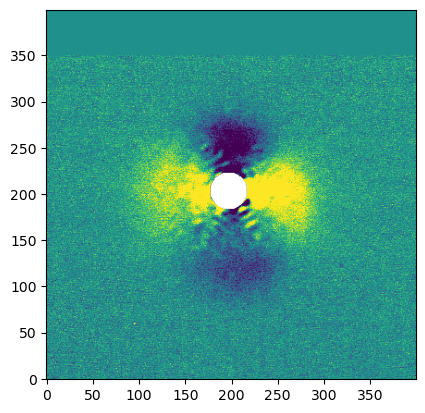

In [17]:
plt.imshow(unrotated_qs[20], vmin=-150, vmax=150, origin='lower')

In [18]:
#Now we need to rotate the unrotated: 

rotated_unrotated_qs = []
rotated_unrotated_us = []

avg_sums = np.average([sums1,sums2],axis=0)
print(np.shape(avg_sums))
rotated_unrotated_is = []

for i in range(23):
    rotated_unrotated_qs.append(rotate(unrotated_qs[i], calculated_pa_collapsed[i],[197,203]))
    rotated_unrotated_us.append(rotate(unrotated_us[i], calculated_pa_collapsed[i],[197,203]))
    rotated_unrotated_is.append(rotate(avg_sums[i], calculated_pa_collapsed[i],[197,203]))
rotated_unrotated_qs = np.array(rotated_unrotated_qs)
rotated_unrotated_us = np.array(rotated_unrotated_us)
rotated_unrotated_is = np.array(rotated_unrotated_is)
    

(23, 400, 400)


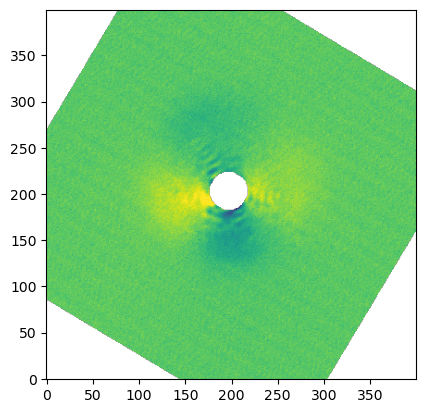

In [20]:
plt.imshow(rotated_unrotated_qs[10],vmax=300,origin='lower')

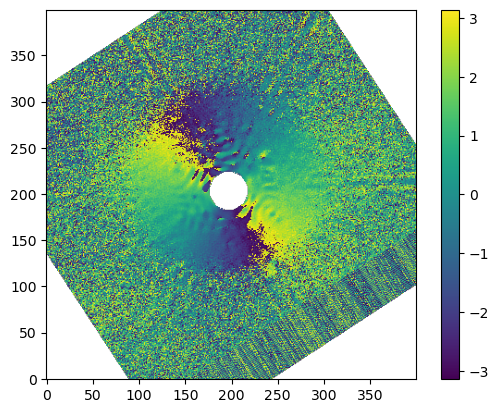

In [59]:
plt.imshow(np.arctan2(rotated_unrotated_qs[15],rotated_unrotated_us[15]),origin='lower')
plt.colorbar()

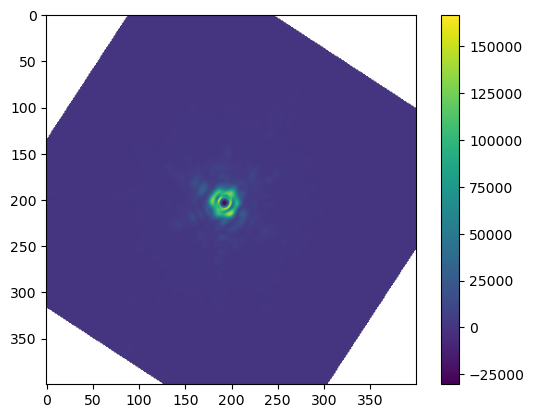

In [60]:
plt.imshow(rotated_unrotated_is[15])
plt.colorbar()

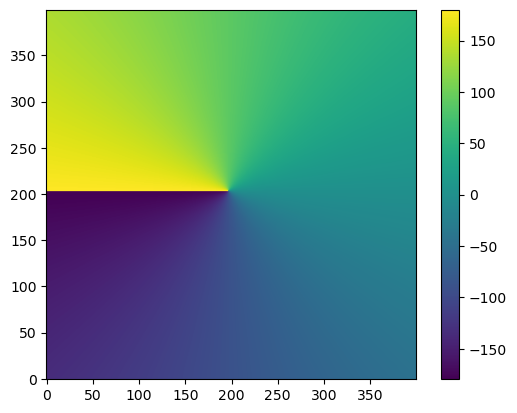

In [61]:
y, x = np.indices(unrotated_qs[0].shape)
y -= center[0]
x -= center[1]
angle_phi = np.degrees(np.arctan2(y,x))
plt.imshow(angle_phi,origin='lower')
plt.colorbar()
rotated_unrotated_qphis = rotated_unrotated_qs * np.cos(2 * np.radians(angle_phi[None,:])) + rotated_unrotated_us * np.sin(2 * np.radians(angle_phi[None,:]))
rotated_unrotated_uphis = -rotated_unrotated_qs * np.sin(2 * np.radians(angle_phi[None,:]))  + rotated_unrotated_us * np.cos(2 * np.radians(angle_phi[None,:]))

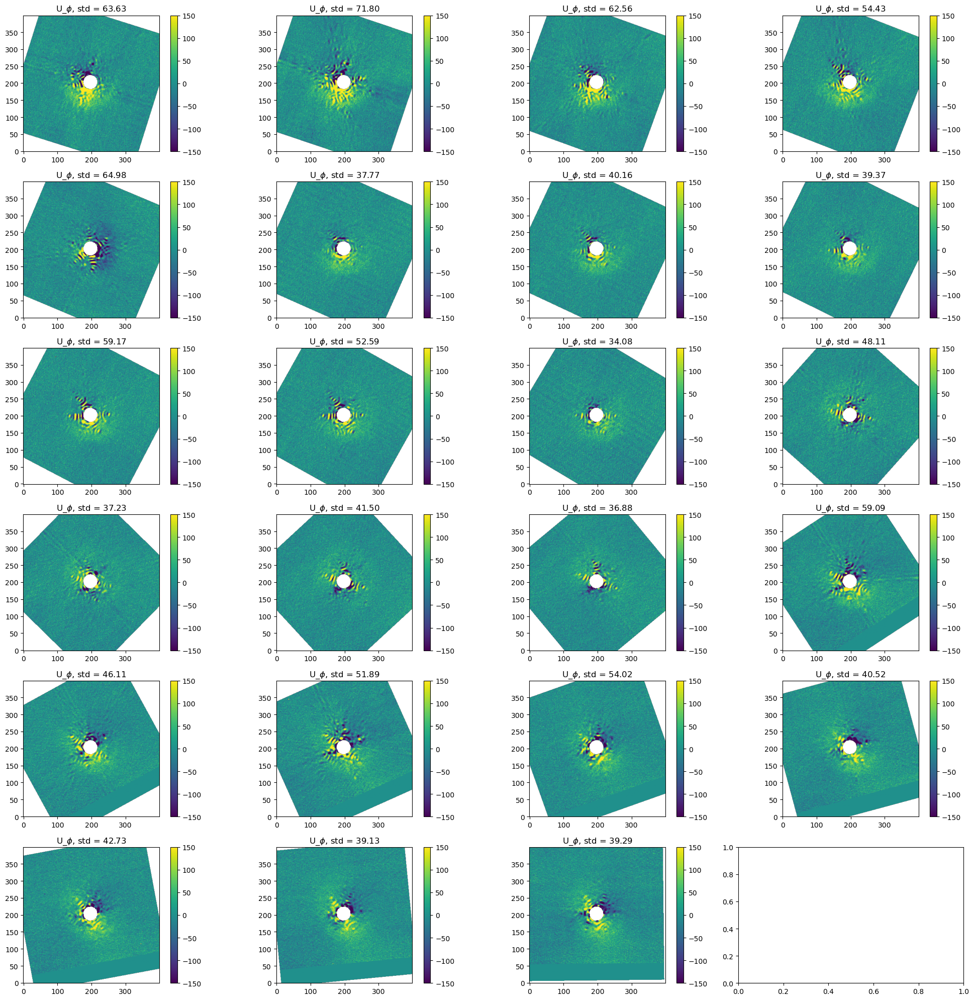

In [62]:
fig, axes = plt.subplots(6, 4, figsize=(20, 20))
axes = axes.flatten()
for i in range(23):
    im = axes[i].imshow(rotated_unrotated_uphis[i], vmin=-150, vmax=150, origin='lower')
    axes[i].set_title(r'U_${\phi}$'+', std = {:.2f}'.format(np.nanstd(np.abs(rotated_unrotated_uphis[i,100:300,100:300]))))
    fig.colorbar(im, ax=axes[i])    
fig.tight_layout()


In [63]:
weights = 1/(np.nanstd(rotated_unrotated_uphis[:,100:300,100:300], axis=(1,2))**8)
weights /= np.nansum(weights)

median_weight = np.median(weights)
percentile_weight = np.percentile(weights, 75)

qphi_weighted = np.average(rotated_unrotated_qphis, axis=0, weights=weights)
uphi_weighted = np.average(rotated_unrotated_uphis, axis=0, weights=weights)

qphi_median = np.median(rotated_unrotated_qphis, axis=0)
uphi_median = np.median(rotated_unrotated_uphis, axis=0)

qphi_median_half = np.median(rotated_unrotated_qphis[weights > percentile_weight], axis=0)
uphi_median_half = np.median(rotated_unrotated_uphis[weights > percentile_weight], axis=0)

Text(0.5, 1.0, 'U$_{\\phi}$ (minimized median half)')

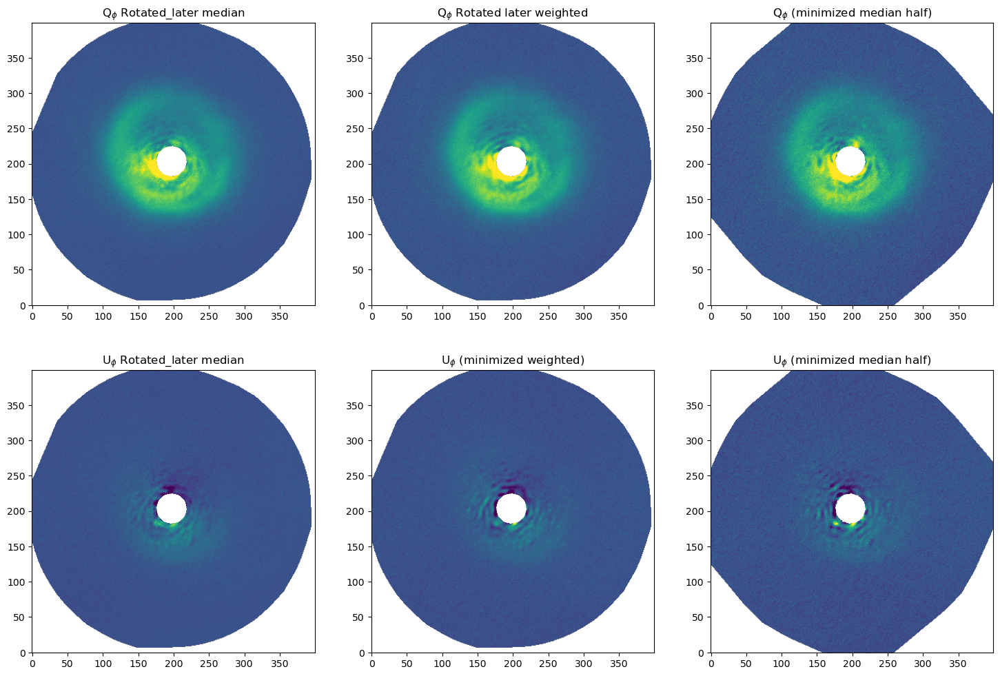

In [64]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# axes = axes.flatten()

vmin=100
vmax=300

axes[0,0].imshow(qphi_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[0,0].set_title(r'Q$_{\phi}$ Rotated_later median')
axes[1,0].imshow(uphi_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[1,0].set_title(r'U$_{\phi}$ Rotated_later median')

axes[0,1].imshow(qphi_weighted, vmin=-vmin, vmax=vmax, origin='lower')
axes[0,1].set_title(r'Q$_{\phi}$ Rotated later weighted')
axes[1,1].imshow(uphi_weighted, vmin=-vmin, vmax=vmax, origin='lower')
axes[1,1].set_title(r'U$_{\phi}$ (minimized weighted)')

axes[0,2].imshow(qphi_median_half, vmin=-vmin, vmax=vmax, origin='lower')
axes[0,2].set_title(r'Q$_{\phi}$ (minimized median half)')
axes[1,2].imshow(uphi_median_half, vmin=-vmin, vmax=vmax, origin='lower')
axes[1,2].set_title(r'U$_{\phi}$ (minimized median half)')


def calc_quphi(x, data, pa, imrot_angle, elevation, calculated_pa, center=[203,197]):

    xshifts = x[:3]
    yshifts = x[3:6]
    shifts = []
    for xs, ys in zip(xshifts, yshifts):
        shifts.append((ys, xs))
    ipq = x[6]
    ipu = x[7]

    
    offset = 59.7
    rot_angle = -pa + elevation + imrot_angle + offset
    diffs = data[:, 0, :, :] - data[:, 1, :, :]
    sums = data[:, 0, :, :] + data[:, 1, :, :]

    for i in np.arange(1,4): 
        diffs[i] = shift(diffs[i], shifts[i-1], order=3, mode='nearest')
        sums[i] = shift(sums[i], shifts[i-1], order=3, mode='nearest')

    indices = np.indices(diffs.shape[1:3])
    radii = np.sqrt((indices[0] - center[0])**2 + (indices[1] - center[1])**2)
    mask = radii < 20
    diffs[:, mask] = np.nan
    sums[:, mask] = np.nan

    #Instrument QU
    q = diffs[0::4, :, :] - diffs[1::4, :, :]
    q -= ipq * sums[0::4, :, :] + ipq * sums[1::4, :, :]

    u = diffs[2::4, :, :] - diffs[3::4, :, :]
    u -= ipu * sums[2::4, :, :] + ipu * sums[3::4, :, :]
    

    #On-sky QU
    unrotated_qsky = (q * np.cos(2 * np.radians(rot_angle)) + u * np.sin(2 * np.radians(rot_angle)))[0]
    unrotated_usky = (q * np.sin(2 * np.radians(rot_angle)) - u * np.cos(2 * np.radians(rot_angle)))[0]

    #Now we need to rotate the unrotated: 

    qsky = rotate(unrotated_qsky, calculated_pa,[197,203])
    usky = rotate(unrotated_usky, calculated_pa,[197,203])

    y, x = np.indices(qsky.shape)
    y -= center[0]
    x -= center[1]
    angle_phi = np.degrees(np.arctan2(x,y))
    qphi = -qsky * np.cos(2 * np.radians(angle_phi)) - usky * np.sin(2 * np.radians(angle_phi))
    uphi = -qsky * np.sin(2 * np.radians(angle_phi)) + usky * np.cos(2 * np.radians(angle_phi))
    return qphi, uphi

def to_minimize(x, data, pas, imrot_angles, elevations,calc_pa):
   _,uphi = calc_quphi(x, data, pas, imrot_angles, elevations,calc_pa)
   return np.nanstd(uphi)

testqphi, testuphi = calc_quphi([0, 0, 0, 0, 0, 0, 0, 0], unrotated_data[:4], pas_collapsed[0], imrot_collapsed[0], elevations_collapsed[0],calculated_pa_collapsed[0])

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
im1 = axes[0].imshow(testqphi,vmin=-150,vmax=150,origin='lower')
axes[0].set_title('Test Q_phi')
fig.colorbar(im1, ax=axes[0])
im2 = axes[1].imshow(testuphi,vmin=-150,vmax=150,origin='lower')
axes[1].set_title('Test U_phi')
fig.colorbar(im2, ax=axes[1])

from scipy.optimize import minimize

# initial_guess = [0, 0, 0, 0, 0, 0, 0, 0]
initial_guess = [-0.23993046,  0.07535992,  0.07145892, -0.20825506,  0.04515258,
        0.13034246,  0.00319186,  0.00207263]

initial_metric = to_minimize(initial_guess, unrotated_data[:4], pas_collapsed[0], imrot_collapsed[0], elevations_collapsed[0],calculated_pa_collapsed[0])
print("Initial metric (std of U_phi):", initial_metric)
result = minimize(to_minimize, initial_guess, args=(unrotated_data[:4], pas_collapsed[0], imrot_collapsed[0], elevations_collapsed[0],calculated_pa_collapsed[0]),method='Nelder-Mead')
print("Optimization result:", result)

qphi_minimized, testuphi_minimized = calc_quphi(result.x, unrotated_data[:4], pas_collapsed[0], imrot_collapsed[0], elevations_collapsed[0],calculated_pa_collapsed[0])

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
im1 = axes[0].imshow(qphi_minimized,vmin=-150,vmax=150,origin='lower')
axes[0].set_title('Minimized Q_phi')
fig.colorbar(im1, ax=axes[0])
im2 = axes[1].imshow(testuphi_minimized,vmin=-150,vmax=150,origin='lower')
axes[1].set_title('Minimized U_phi')
fig.colorbar(im2, ax=axes[1])


results = []
for i in range(23):
    initial_guess = [-0.23993046,  0.07535992,  0.07145892, -0.20825506,  0.04515258,
        0.13034246,  0.00319186,  0.00207263]
    initial_metric = to_minimize(initial_guess, unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i])
    print(f"Initial metric for set {i+1} (std of U_phi):", initial_metric)
    res = minimize(to_minimize, initial_guess, args=(unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i]),method='Nelder-Mead')
    results.append(res)
    final_metric = to_minimize(res.x, unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i])
    print(f"Final metric for set {i+1} (std of U_phi):", final_metric)
    # print(f"Optimization result for set {i+1}:", res)

qphis_minimized = []
uphis_minimized = []
for i in range(23): 
    if i==4:
        pass
    else:
        starting_guess = [0,0,0,0,0,0,0,0]
        qphi_default, uphi_default = calc_quphi(starting_guess, unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i])
        result = results[i]
        qphi_minimized, uphi_minimized = calc_quphi(result.x, unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i])

        qphis_minimized.append(qphi_minimized)
        uphis_minimized.append(uphi_minimized)

        fig, axes = plt.subplots(1, 4, figsize=(20, 6))
        im1 = axes[0].imshow(qphi_default,vmin=-150,vmax=150,origin='lower')
        axes[0].set_title(f'Set {i+1} Default Q_phi')
        fig.colorbar(im1, ax=axes[0])
        im2 = axes[1].imshow(qphi_minimized,vmin=-150,vmax=150,origin='lower')
        axes[1].set_title(f'Set {i+1} Minimized Q_phi')
        fig.colorbar(im2, ax=axes[1])

        im3 = axes[2].imshow(uphi_default,vmin=-150,vmax=150,origin='lower')
        axes[2].set_title(f'Set {i+1} Default U_phi')
        fig.colorbar(im3, ax=axes[2])
        im4 = axes[3].imshow(uphi_minimized,vmin=-150,vmax=150,origin='lower')
        axes[3].set_title(f'Set {i+1} Minimized U_phi')
        fig.colorbar(im4, ax=axes[3])


    plt.suptitle(f'Set {i+1} Before and After Minimization')
    plt.show()
qphis_minimized = np.array(qphis_minimized)
uphis_minimized = np.array(uphis_minimized)


weights = 1/(np.nanstd(uphis_minimized[:,100:300,100:300], axis=(1,2))**8)
weights /= np.nansum(weights)

qphi_minimized_weighted = np.average(qphis_minimized, axis=0, weights=weights)
uphi_minimized_weighted = np.average(uphis_minimized, axis=0, weights=weights)

qphi_minimized_median = np.median(qphis_minimized, axis=0)
uphi_minimized_median = np.median(uphis_minimized, axis=0)

fig, axes = plt.subplots(3, 2, figsize=(18, 12))

axes = axes.flatten()

vmin=100
vmax=300

axes[0].imshow(qphi_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[0].set_title(r'Q$_{\phi}$ (median)')
axes[1].imshow(uphi_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[1].set_title(r'U$_{\phi}$ (median)')

axes[2].imshow(qphi_minimized_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[2].set_title(r'Q$_{\phi}$ (minimized)')
axes[3].imshow(uphi_minimized_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[3].set_title(r'U$_{\phi}$ (minimized)')

axes[4].imshow(qphi_minimized_weighted, vmin=-vmin, vmax=vmax, origin='lower')
axes[4].set_title(r'Q$_{\phi}$ (minimized weighted)')
axes[5].imshow(uphi_minimized_weighted, vmin=-vmin, vmax=vmax, origin='lower')
axes[5].set_title(r'U$_{\phi}$ (minimized weighted)')


In [65]:
def calc_quphi(x, data, pa, imrot_angle, elevation, calculated_pa, center=[203,197]):

    xshifts = x[:3]
    yshifts = x[3:6]
    shifts = []
    for xs, ys in zip(xshifts, yshifts):
        shifts.append((ys, xs))
    ipq = x[6]
    ipu = x[7]
    oe_xshifts = x[8:12]
    oe_yshifts = x[12:]
    oe_shifts = []
    for xs, ys in zip(oe_xshifts, oe_yshifts):
        oe_shifts.append((ys, xs))

    rot_angle = -2*pa+2*elevation+2*imrot_angle-4*offset

    #print(np.shape(oe_shifts))
    diffs = data[:, 1, :, :] - data[:, 0, :, :]
    sums = data[:, 0, :, :] + data[:, 1, :, :]

    for i in np.arange(0,4):
        diffs[i, :, :] = data[i, 1, :, :] - shift(data[i, 0, :, :],oe_shifts[i],order=3, mode='nearest')
        sums[i, :, :] = data[i, 0, :, :] + shift(data[i, 1, :, :],oe_shifts[i],order=3, mode='nearest')

    for i in np.arange(1,4): 
        diffs[i] = shift(diffs[i], shifts[i-1], order=3, mode='nearest')
        sums[i] = shift(sums[i], shifts[i-1], order=3, mode='nearest')
    #print(np.shape(shifts))

    # Create the mask with the adjusted center
    indices = np.indices(diffs.shape[1:3])
    radii = np.sqrt((indices[0] - center[0])**2 + (indices[1] - center[1])**2)
    mask = radii < 20
    diffs[:, mask] = np.nan
    sums[:, mask] = np.nan

    #Instrument QU
    q = diffs[0::4, :, :] - diffs[1::4, :, :]
    q -= ipq * sums[0::4, :, :] + ipq * sums[1::4, :, :]

    u = diffs[2::4, :, :] - diffs[3::4, :, :]
    u -= ipu * sums[2::4, :, :] + ipu * sums[3::4, :, :]
    
    i = np.average(sums,axis=0)
    #print(np.shape(i))

    #On-sky QU
    unrotated_qsky = (q * np.cos(np.radians(rot_angle)) + u * np.sin(np.radians(rot_angle)))[0]
    unrotated_usky = (-q * np.sin(np.radians(rot_angle)) + u * np.cos(np.radians(rot_angle)))[0]

    #Now we need to rotate the unrotated: 

    qsky = rotate(unrotated_qsky, calculated_pa,[197,203])
    usky = rotate(unrotated_usky, calculated_pa,[197,203])
    isky = rotate(i,calculated_pa,[197,203])

    y, x = np.indices(qsky.shape)
    y -= center[0]
    x -= center[1]
    angle_phi = np.degrees(np.arctan2(y,x))
    qphi = qsky * np.cos(2 * np.radians(angle_phi)) + usky * np.sin(2 * np.radians(angle_phi))
    uphi = -qsky * np.sin(2 * np.radians(angle_phi)) + usky * np.cos(2 * np.radians(angle_phi))

    return qphi, uphi, isky

def to_minimize(x, data, pas, imrot_angles, elevations,calc_pa):
   _,uphi,i = calc_quphi(x, data, pas, imrot_angles, elevations,calc_pa)
   return np.nanstd(uphi)

In [66]:
testqphi, testuphi,testi = calc_quphi([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0], unrotated_data[4:8], pas_collapsed[1], imrot_collapsed[1], elevations_collapsed[1],calculated_pa_collapsed[1])

/tmp/ipykernel_525186/394478247.py:8: RuntimeWarning: invalid value encountered in log10
  im3 = axes[2].imshow(np.log10(testi),origin='lower')


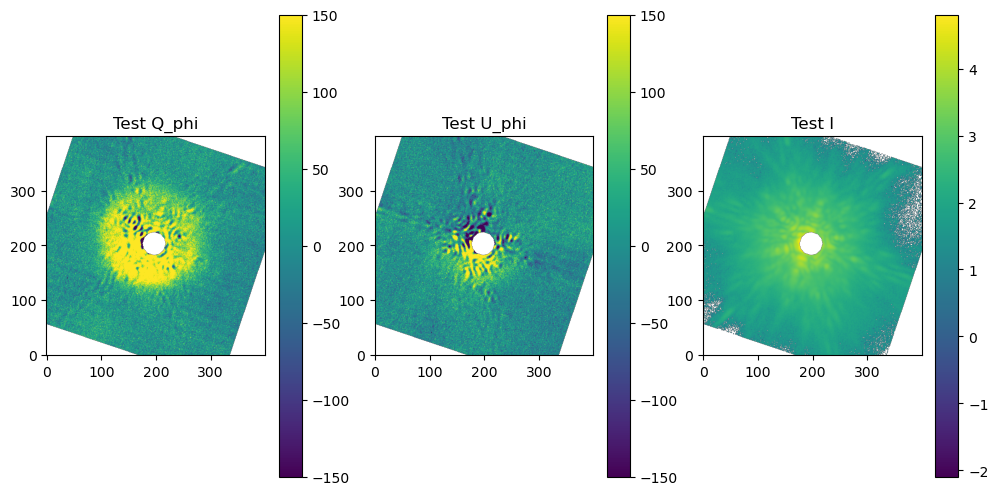

In [67]:
fig, axes = plt.subplots(1, 3, figsize=(12, 6))
im1 = axes[0].imshow(testqphi,vmin=-150,vmax=150,origin='lower')
axes[0].set_title('Test Q_phi')
fig.colorbar(im1, ax=axes[0])
im2 = axes[1].imshow(testuphi,vmin=-150,vmax=150,origin='lower')
axes[1].set_title('Test U_phi')
fig.colorbar(im2, ax=axes[1])
im3 = axes[2].imshow(np.log10(testi),origin='lower')
axes[2].set_title('Test I')
fig.colorbar(im3, ax=axes[2])

In [68]:
from scipy.optimize import minimize

# initial_guess = [0, 0, 0, 0, 0, 0, 0, 0]
initial_guess = [-0.23993046,  0.07535992,  0.07145892, -0.20825506,  0.04515258,
        0.13034246,  0.00319186,  0.00207263, 0, 0, 0, 0, 0, 0, 0, 0]

initial_metric = to_minimize(initial_guess, unrotated_data[:4], pas_collapsed[0], imrot_collapsed[0], elevations_collapsed[0],calculated_pa_collapsed[0])
print("Initial metric (std of U_phi):", initial_metric)
result = minimize(to_minimize, initial_guess, args=(unrotated_data[:4], pas_collapsed[0], imrot_collapsed[0], elevations_collapsed[0],calculated_pa_collapsed[0]),method='Nelder-Mead')
print("Optimization result:", result)

Initial metric (std of U_phi): 49.951528624268406
Optimization result:        message: Maximum number of function evaluations has been exceeded.
       success: False
        status: 1
           fun: 34.84408769956121
             x: [ 1.683e-01  5.124e-01 ...  2.200e-02 -1.397e-02]
           nit: 2486
          nfev: 3200
 final_simplex: (array([[ 1.683e-01,  5.124e-01, ...,  2.200e-02,
                        -1.397e-02],
                       [ 1.671e-01,  5.111e-01, ...,  2.309e-02,
                        -1.452e-02],
                       ...,
                       [ 1.630e-01,  5.274e-01, ...,  2.442e-02,
                        -1.232e-02],
                       [ 1.672e-01,  5.158e-01, ...,  2.544e-02,
                        -1.492e-02]], shape=(17, 16)), array([ 3.484e+01,  3.484e+01, ...,  3.485e+01,  3.485e+01],
                      shape=(17,)))


/tmp/ipykernel_525186/2853900959.py:10: RuntimeWarning: invalid value encountered in log10
  im3 = axes[2].imshow(np.log10(testi),origin='lower')


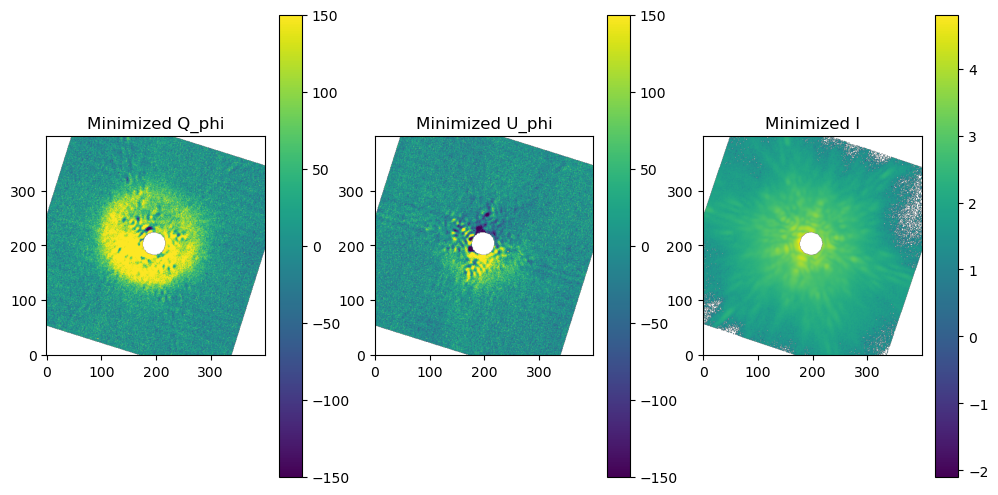

In [69]:
qphi_minimized, testuphi_minimized, testi_minimized = calc_quphi(result.x, unrotated_data[:4], pas_collapsed[0], imrot_collapsed[0], elevations_collapsed[0],calculated_pa_collapsed[0])

fig, axes = plt.subplots(1, 3, figsize=(12, 6))
im1 = axes[0].imshow(qphi_minimized,vmin=-150,vmax=150,origin='lower')
axes[0].set_title('Minimized Q_phi')
fig.colorbar(im1, ax=axes[0])
im2 = axes[1].imshow(testuphi_minimized,vmin=-150,vmax=150,origin='lower')
axes[1].set_title('Minimized U_phi')
fig.colorbar(im2, ax=axes[1])
im3 = axes[2].imshow(np.log10(testi),origin='lower')
axes[2].set_title('Minimized I')
fig.colorbar(im3, ax=axes[2])


In [ ]:
from scipy.optimize import minimize
results = []
for i in range(23):
    initial_guess = [-0.23993046,  0.07535992,  0.07145892, -0.20825506,  0.04515258,
        0.13034246,  0.00319186,  0.00207263, 0, 0, 0, 0, 0, 0, 0, 0]
    initial_metric = to_minimize(initial_guess, unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i])
    print(f"Initial metric for set {i+1} (std of U_phi):", initial_metric)
    res = minimize(to_minimize, initial_guess, args=(unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i]),method='Nelder-Mead')
    results.append(res)
    final_metric = to_minimize(res.x, unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i])
    print(f"Final metric for set {i+1} (std of U_phi):", final_metric)
    # print(f"Optimization result for set {i+1}:", res)

Initial metric for set 1 (std of U_phi): 49.951528624268406
Final metric for set 1 (std of U_phi): 34.84408769956121
Initial metric for set 2 (std of U_phi): 52.246100798439336


In [ ]:
qphis_minimized = []
uphis_minimized = []
is_minimized = []
for i in range(23): 
    if i==4:
        pass
    else:
        starting_guess = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
        qphi_default, uphi_default, i_default = calc_quphi(starting_guess, unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i])
        result = results[i]
        qphi_minimized, uphi_minimized,i_minimized = calc_quphi(result.x, unrotated_data[4*i:4*i+4], pas_collapsed[i], imrot_collapsed[i], elevations_collapsed[i],calculated_pa_collapsed[i])

        qphis_minimized.append(qphi_minimized)
        uphis_minimized.append(uphi_minimized)
        is_minimized.append(i_minimized)

        fig, axes = plt.subplots(1, 4, figsize=(20, 6))
        im1 = axes[0].imshow(qphi_default,vmin=-150,vmax=150,origin='lower')
        axes[0].set_title(f'Set {i+1} Default Q_phi')
        fig.colorbar(im1, ax=axes[0])
        im2 = axes[1].imshow(qphi_minimized,vmin=-150,vmax=150,origin='lower')
        axes[1].set_title(f'Set {i+1} Minimized Q_phi')
        fig.colorbar(im2, ax=axes[1])

        im3 = axes[2].imshow(uphi_default,vmin=-150,vmax=150,origin='lower')
        axes[2].set_title(f'Set {i+1} Default U_phi')
        fig.colorbar(im3, ax=axes[2])
        im4 = axes[3].imshow(uphi_minimized,vmin=-150,vmax=150,origin='lower')
        axes[3].set_title(f'Set {i+1} Minimized U_phi')
        fig.colorbar(im4, ax=axes[3])


    plt.suptitle(f'Set {i+1} Before and After Minimization')
    plt.show()
qphis_minimized = np.array(qphis_minimized)
uphis_minimized = np.array(uphis_minimized)


In [ ]:
weights = 1/(np.nanstd(uphis_minimized[:,100:300,100:300], axis=(1,2))**8)
weights /= np.nansum(weights)

qphi_minimized_weighted = np.average(qphis_minimized, axis=0, weights=weights)
uphi_minimized_weighted = np.average(uphis_minimized, axis=0, weights=weights)

qphi_minimized_median = np.median(qphis_minimized, axis=0)
uphi_minimized_median = np.median(uphis_minimized, axis=0)
i_minimized_median = np.median(is_minimized,axis=0)

fig, axes = plt.subplots(3, 2, figsize=(18, 12))

axes = axes.flatten()

vmin=100
vmax=300

axes[0].imshow(qphi_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[0].set_title(r'Q$_{\phi}$ (median)')
axes[1].imshow(uphi_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[1].set_title(r'U$_{\phi}$ (median)')
print(np.nanstd(qphi_median))

axes[2].imshow(qphi_minimized_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[2].set_title(r'Q$_{\phi}$ (minimized)')
axes[3].imshow(uphi_minimized_median, vmin=-vmin, vmax=vmax, origin='lower')
axes[3].set_title(r'U$_{\phi}$ (minimized)')
print(np.nanstd(qphi_minimized_median))

axes[4].imshow(qphi_minimized_weighted, vmin=-vmin, vmax=vmax, origin='lower')
axes[4].set_title(r'Q$_{\phi}$ (minimized weighted)')
axes[5].imshow(uphi_minimized_weighted, vmin=-vmin, vmax=vmax, origin='lower')
axes[5].set_title(r'U$_{\phi}$ (minimized weighted)')
print(np.nanstd(qphi_minimized_weighted))

In [ ]:
plt.imshow(i_minimized_median)
plt.colorbar()

In [4]:
data = fits.getdata("output_cube_77_CORRECT.fits")
i_minimized_median = data[0]
qphi_minimized_median = data[1]
uphi_minimized_median = data[2]

<>:22: SyntaxWarning: invalid escape sequence '\D'
<>:32: SyntaxWarning: invalid escape sequence '\D'
<>:22: SyntaxWarning: invalid escape sequence '\D'
<>:32: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_592489/1690898804.py:22: SyntaxWarning: invalid escape sequence '\D'
  axes[0].set_ylabel('$\Delta$Dec (")',fontsize=12)
/tmp/ipykernel_592489/1690898804.py:32: SyntaxWarning: invalid escape sequence '\D'
  axes[1].set_xlabel('$\Delta$RA (")',fontsize=12)
/tmp/ipykernel_592489/1690898804.py:48: UserWarning: Adding colorbar to a different Figure <Figure size 1200x500 with 6 Axes> than <Figure size 1200x600 with 4 Axes> which fig.colorbar is called on.
  fig.colorbar(im,ax=axes[1],fraction=.05,location='right',pad=0.01,label='Counts')


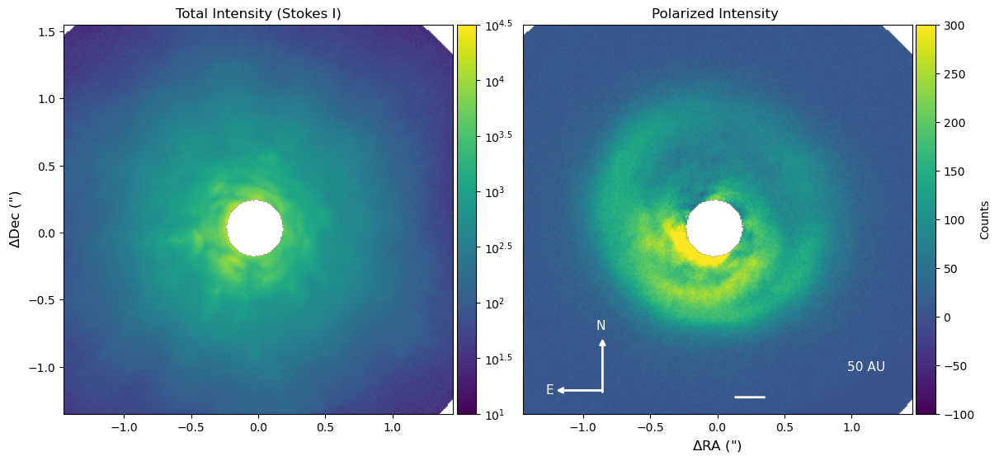

In [10]:
fig, axes = plt.subplots(1, 2,figsize=(12,6),constrained_layout=True)
axes = axes.flatten()

vmin=-100
vmax=300

nx,ny = np.shape(qphi_minimized_median)
pixel_scale = 0.009942

extent = [
    -nx/2 * pixel_scale,
     nx/2 * pixel_scale,
    -ny/2 * pixel_scale,
     ny/2 * pixel_scale
]

from matplotlib.ticker import FuncFormatter
im1 = axes[0].imshow(np.log10(i_minimized_median),vmax=4.5,vmin=1,origin='lower',extent=extent)
axes[0].set_title(r'Total Intensity (Stokes I)',fontsize=12)
axes[0].set_xlim(-1.45,1.45)
axes[0].set_ylim(-1.35,1.55)
axes[0].set_ylabel('$\Delta$Dec (")',fontsize=12)
cb = fig.colorbar(im1, ax=axes[0], fraction=.05, location='right', pad=0.01)
cb.ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: r'$10^{%.4g}$' % x))
#cb.set_label('Counts')

axes[1].imshow(np.sqrt(qphi_minimized_median**2 + uphi_minimized_median**2), vmax=vmax, vmin=vmin, origin='lower', extent=extent)
axes[1].set_title(r'Polarized Intensity ',fontsize=12)
axes[1].set_xlim(-1.45,1.45)
axes[1].set_ylim(-1.35,1.55)
axes[1].set_yticks([])
axes[1].set_xlabel('$\Delta$RA (")',fontsize=12)
axes[1].annotate('',xy=(255,20),xytext=(295.8,20),xycoords='axes pixels',arrowprops=dict(arrowstyle='-', color='white', lw=2))
axes[1].annotate('', xy=(0.205, 0.20), xytext=(0.205, 0.05),
            xycoords='axes fraction', arrowprops=dict(arrowstyle='->', color='white', lw=2))
axes[1].annotate('', xy=(0.08, 0.06), xytext=(0.21, 0.06),
            xycoords='axes fraction', arrowprops=dict(arrowstyle='->', color='white', lw=2))
axes[1].text(0.20, 0.21, 'N', transform=axes[1].transAxes, color='white', ha='center', va='bottom', fontsize=11)
axes[1].text(0.08, 0.06, 'E', transform=axes[1].transAxes, color='white', ha='right', va='center', fontsize=11)
axes[1].text(1.25, -1, '50 AU', color='white', ha='right', va='center', fontsize=11)

#im = axes[2].imshow(uphi_minimized_median,vmax=vmax,vmin=vmin,origin='lower',extent=extent)
#axes[2].set_title(r'U$_{\phi}$ ',fontsize=12)
#axes[2].set_xlim(-1.45,1.45)
#axes[2].set_ylim(-1.35,1.55)
#axes[2].set_yticks([])

fig.colorbar(im,ax=axes[1],fraction=.05,location='right',pad=0.01,label='Counts')
#
#plt.tight_layout()

plt.savefig('ab_aur_minimized_LABELED2_77_CORRECT_PI.png')
plt.show()

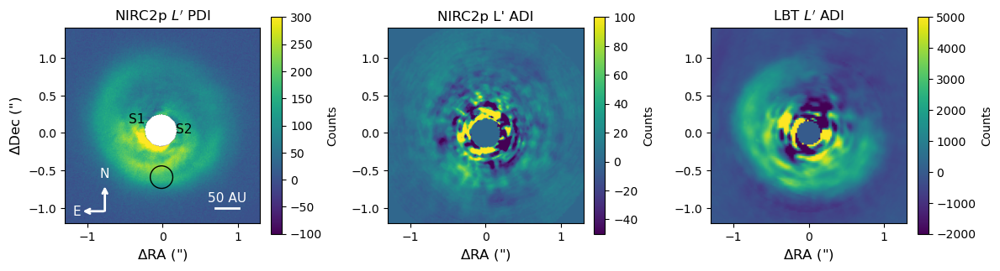

In [7]:
from scipy.ndimage import median_filter

fig, ax = plt.subplots(1,3,figsize=(12,5))
im = ax[0].imshow(qphi_minimized_median, vmax=vmax, vmin=vmin, origin='lower', extent=extent)
ax[0].text(0.37,  0.53, 'S1', color='black', ha='center', va='center', fontsize=11, transform=ax[0].transAxes)
ax[0].text(0.61,  0.48, 'S2', color='black', ha='center', va='center', fontsize=11, transform=ax[0].transAxes)
cb = fig.colorbar(im, ax=ax[0], fraction=0.05,label='Counts')

ax[0].set_xlim(-1.3, 1.3)
ax[0].set_ylim(-1.2, 1.4)
ax[0].set_xlabel('$\\Delta$RA (")', fontsize=12)
ax[0].set_ylabel('$\\Delta$Dec (")', fontsize=12)

# --- Compass arrows (N up, E left) ---
arrow_kw = dict(xycoords='axes fraction', arrowprops=dict(arrowstyle='->', color='white', lw=2),
                annotation_clip=False)
ax[0].annotate('', xy=(0.205, 0.20), xytext=(0.205, 0.05), **arrow_kw)
ax[0].annotate('', xy=(0.08,  0.06), xytext=(0.21,  0.06), **arrow_kw)
ax[0].text(0.205, 0.22, 'N', color='white', ha='center', va='bottom', fontsize=11, transform=ax[0].transAxes)
ax[0].text(0.06,  0.06, 'E', color='white', ha='center', va='center', fontsize=11, transform=ax[0].transAxes)

# --- Scale bar ax[0] ---
scale_arcsec = 50 / 156   # ~0.3205 arcsec
bar_x_start = 0.7
bar_x_end   = bar_x_start + scale_arcsec
bar_y       = -1
ax[0].plot([bar_x_start, bar_x_end], [bar_y, bar_y], color='white', lw=2)
ax[0].text((bar_x_start + bar_x_end) / 2, bar_y + 0.05, '50 AU',
           color='white', ha='center', va='bottom', fontsize=11)

import matplotlib.patches as mpatches
artist = mpatches.Circle((-0.013, -0.589), radius=0.15, fill=False)
ax[0].add_artist(artist)
ax[0].set_title("NIRC2p $L'$ PDI")

# --- ax[1]: Jayke ADI ---
adi = fits.getdata('ab_aur_reduced_combined_frames_drot_2.0_pca_5.fits')
ny, nx = adi.shape
extent2 = [-nx/2 * pixel_scale,  nx/2 * pixel_scale,
           -ny/2 * pixel_scale,  ny/2 * pixel_scale]

im2 = ax[1].imshow(median_filter(adi, size=3), origin='lower', vmax=vmax/3, vmin=vmin/2, extent=extent)
cb = fig.colorbar(im2, ax=ax[1], fraction=0.05,label='Counts')
ax[1].set_title("NIRC2p L' ADI")
ax[1].set_xlim(-1.3, 1.3)
ax[1].set_ylim(-1.2, 1.4)
ax[1].set_xlabel('$\\Delta$RA (")', fontsize=12)
#ax[2].set_ylabel('$\\Delta$Dec (")', fontsize=12)

# --- ax[1]: LBT LMIRcam ---
pixel_scale2 = 0.022  # arcsec/px
lbt = fits.getdata('ABAur_LBTLMIRCam_Lprime_mJyas2.fits')
ny, nx = lbt.shape
extent2 = [-nx/2 * pixel_scale2,  nx/2 * pixel_scale2,
           -ny/2 * pixel_scale2,  ny/2 * pixel_scale2]

im2 = ax[2].imshow(lbt, origin='lower', vmax=5000, vmin=-2000, extent=extent2)
cb = fig.colorbar(im2, ax=ax[2], fraction=0.05,label='Counts')
ax[2].set_title("LBT $L'$ ADI")
ax[2].set_xlim(-1.3, 1.3)
ax[2].set_ylim(-1.2, 1.4)
ax[2].set_xlabel('$\\Delta$RA (")', fontsize=12)
#ax[2].set_ylabel('$\\Delta$Dec (")', fontsize=12)

plt.tight_layout()
plt.savefig('ab_aur_annotated_fixed_77_CORRECT.png', dpi=400)
plt.show()

In [ ]:
print(results[0].x[8:12])

In [ ]:
for j in range(8,12):
    for i in range(len(results)):
        plt.plot(i,results[i].x[j],marker='o',color='k')
    plt.title('xshift {}'.format(j-7))
    plt.show()

for j in range(12,16):
    for i in range(len(results)):
        plt.plot(i,results[i].x[j],marker='o',color='k')
    plt.title('yshift {}'.format(j-11))
    plt.show()

In [ ]:
cube = np.stack([i_minimized_median,qphi_minimized_median,uphi_minimized_median],axis=0)

from astropy.io import fits

# Create a FITS file
hdu = fits.PrimaryHDU(cube)
hdul = fits.HDUList([hdu])

# Save the FITS file
hdul.writeto('output_cube_77_CORRECT.fits', overwrite=True)

print("FITS file saved successfully!")